# Data exploration

In [1]:
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
import numpy as np
from pathlib import Path

In [2]:
data_dir = Path('../data')
result_dir = Path('../results')

In [3]:
raw_csv =  data_dir / 'dm1_dataset_2425_imdb/train.csv'
df = pd.read_csv(raw_csv)
df.shape

(16431, 23)

In [4]:
df.head()

,originalTitle,rating,startYear,endYear,runtimeMinutes,awardWins,numVotes,worstRating,bestRating,totalImages,...,titleType,awardNominationsExcludeWins,canHaveEpisodes,isRatable,isAdult,numRegions,userReviewsTotal,ratingCount,countryOfOrigin,genres
0,Neogenic Nightmare Chapter 3: Hydro-Man,"(7, 8]",1995,\N,\N,0.0,779,1,10,1,...,tvEpisode,0,False,True,0,1,0,781,['US'],"Action,Adventure,Animation"
1,Looping,"(5, 6]",1982,\N,\N,0.0,11,1,10,1,...,videoGame,0,False,True,0,1,0,11,['XWG'],Action
2,Idealnaya para,"(5, 6]",1992,\N,\N,0.0,38,1,10,1,...,movie,0,False,True,0,1,1,38,['RU'],Comedy
3,MasterChef Celebrity México,"(5, 6]",2021,\N,\N,0.0,15,1,10,22,...,tvSeries,0,True,True,0,1,0,15,['MX'],Reality-TV
4,Seutateueob,"(7, 8]",2020,2020,80,1.0,15718,1,10,347,...,tvSeries,1,True,True,0,32,452,15746,['KR'],"Comedy,Drama,Romance"


We can see that some null values are encoded as '\N' in the original dataset, so we can say that to pandas when loading the dataframe from the csv.
We can pass to `read_csv` the parameter `na_values` with a list of strings to recognize as `NaN`.

In [5]:
df = pd.read_csv(raw_csv, na_values=['\\N'])
df.head()

,originalTitle,rating,startYear,endYear,runtimeMinutes,awardWins,numVotes,worstRating,bestRating,totalImages,...,titleType,awardNominationsExcludeWins,canHaveEpisodes,isRatable,isAdult,numRegions,userReviewsTotal,ratingCount,countryOfOrigin,genres
0,Neogenic Nightmare Chapter 3: Hydro-Man,"(7, 8]",1995,NaN,NaN,0.0,779,1,10,1,...,tvEpisode,0,False,True,0,1,0,781,['US'],"Action,Adventure,Animation"
1,Looping,"(5, 6]",1982,NaN,NaN,0.0,11,1,10,1,...,videoGame,0,False,True,0,1,0,11,['XWG'],Action
2,Idealnaya para,"(5, 6]",1992,NaN,NaN,0.0,38,1,10,1,...,movie,0,False,True,0,1,1,38,['RU'],Comedy
3,MasterChef Celebrity México,"(5, 6]",2021,NaN,NaN,0.0,15,1,10,22,...,tvSeries,0,True,True,0,1,0,15,['MX'],Reality-TV
4,Seutateueob,"(7, 8]",2020,2020.0,80.0,1.0,15718,1,10,347,...,tvSeries,1,True,True,0,32,452,15746,['KR'],"Comedy,Drama,Romance"


`CountryofOrigin` and `genres` contain collections of categorical values.
We can transform them in lists in order to handle them with more ease.

In [6]:
import ast
df['countryOfOrigin'] = df['countryOfOrigin'].apply(ast.literal_eval)
df['genres'] = df['genres'].str.split(',')

In [7]:
df['countryOfOrigin'][0], df['genres'][0]

(['US'], ['Action', 'Adventure', 'Animation'])

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16431 entries, 0 to 16430
Data columns (total 23 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   originalTitle                16431 non-null  object 
 1   rating                       16431 non-null  object 
 2   startYear                    16431 non-null  int64  
 3   endYear                      814 non-null    float64
 4   runtimeMinutes               11579 non-null  float64
 5   awardWins                    13813 non-null  float64
 6   numVotes                     16431 non-null  int64  
 7   worstRating                  16431 non-null  int64  
 8   bestRating                   16431 non-null  int64  
 9   totalImages                  16431 non-null  int64  
 10  totalVideos                  16431 non-null  int64  
 11  totalCredits                 16431 non-null  int64  
 12  criticReviewsTotal           16431 non-null  int64  
 13  titleType       

Only tv series and miniseries have a end year, but not all of them, probably because it doesn't make sense for serial productions which are still running or miniseries that run for a limited period of time.

Since this property has so many missing values, it is probably safe to drop it.

In [9]:
missing_endyear = df['endYear'].isnull()
df[~ missing_endyear]['titleType'].unique()

array(['tvSeries', 'tvMiniSeries'], dtype=object)

We can see that the serial title that miss the end year are either tv miniseries which have a limited run or tvSeries which are probably still airing.

In [10]:
is_serial = df['titleType'].isin(['tvSeries', 'tvMiniSeries'])
df[is_serial & missing_endyear][['originalTitle', 'startYear', 'endYear', 'titleType']]

,originalTitle,startYear,endYear,titleType
3,MasterChef Celebrity México,2021,NaN,tvSeries
7,Nanba MG5,2022,NaN,tvMiniSeries
9,Ulot Puran,2022,NaN,tvMiniSeries
99,The Diplomat,2023,NaN,tvSeries
140,Drive Thru History,2005,NaN,tvSeries
...,...,...,...,...
16307,See HIM Fuck,2019,NaN,tvSeries
16349,American Agenda,2019,NaN,tvSeries
16352,L'idiota,1959,NaN,tvMiniSeries
16388,Glykes alhimeies,2008,NaN,tvSeries


`awardWins` has some missing values. It makes sense to fill them with 0 since it is the most frequent value for that feature.

In [11]:
df['awardWins'].describe()

count    13813.000000
mean         0.491855
std          2.974264
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max        145.000000
Name: awardWins, dtype: float64

In [12]:
df['awardWins'].fillna(0, inplace=True)

/tmp/ipykernel_8838/1439164916.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['awardWins'].fillna(0, inplace=True)


In [13]:
df[df['canHaveEpisodes']]['titleType'].value_counts()

titleType
tvSeries        1375
tvMiniSeries     224
Name: count, dtype: int64

`rating` is the IMDB rating class for the title. This is an ordinal feature, so it probably makes sense to create also a numerical feature `ratingNum` based on this in order to be able to perform regression analysis on it.

Also, `isAdult` should be boolean.

In [14]:
rating_classes = sorted(df['rating'].unique())
rating_classes

['(0, 1]',
 '(1, 2]',
 '(2, 3]',
 '(3, 4]',
 '(4, 5]',
 '(5, 6]',
 '(6, 7]',
 '(7, 8]',
 '(8, 9]',
 '(9, 10]']

In [15]:
rating_map = {
    rclass: i+1
    for i, rclass in enumerate(rating_classes)
}

df['ratingNum'] = df['rating']
df = df.replace({'ratingNum': rating_map, 'isAdult': {0: False, 1:True}})
df[['rating', 'ratingNum', 'isAdult']].head()

/tmp/ipykernel_8838/650284600.py:7: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df = df.replace({'ratingNum': rating_map, 'isAdult': {0: False, 1:True}})


,rating,ratingNum,isAdult
0,"(7, 8]",8,False
1,"(5, 6]",6,False
2,"(5, 6]",6,False
3,"(5, 6]",6,False
4,"(7, 8]",8,False


`bestRating` , `WorstRating` and `isRatable` can be safely dropped, since they provide no information at all.

In [16]:
print(df['bestRating'].value_counts())
print(df['worstRating'].value_counts())
print(df['isRatable'].value_counts())

bestRating
10    16431
Name: count, dtype: int64
worstRating
1    16431
Name: count, dtype: int64
isRatable
True    16431
Name: count, dtype: int64


In [17]:
df = df.drop(['bestRating', 'worstRating', 'isRatable'], axis=1)

In [18]:
df.describe()

,startYear,endYear,runtimeMinutes,awardWins,numVotes,totalImages,totalVideos,totalCredits,criticReviewsTotal,awardNominationsExcludeWins,numRegions,userReviewsTotal,ratingCount,ratingNum
count,16431.000000,814.000000,11579.000000,16431.000000,16431.000000,16431.000000,16431.000000,16431.000000,16431.000000,16431.000000,16431.000000,16431.000000,16431.000000,16431.000000
mean,1991.867081,2001.574939,61.222644,0.413487,1492.153551,11.477025,0.271499,61.341976,2.785527,0.558883,3.549206,7.228410,1492.915039,7.155620
std,26.120690,18.449257,52.110187,2.732959,20137.708096,74.254261,3.115448,174.017450,15.411389,3.955372,5.854671,66.495606,20145.393446,1.386902
min,1878.000000,1945.000000,0.000000,0.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,5.000000,1.000000
25%,1978.000000,1989.000000,25.000000,0.000000,15.000000,1.000000,0.000000,16.000000,0.000000,0.000000,1.000000,0.000000,15.000000,6.000000
50%,1997.000000,2005.500000,58.000000,0.000000,36.000000,1.000000,0.000000,34.000000,0.000000,0.000000,1.000000,0.000000,36.000000,7.000000
75%,2013.000000,2018.000000,90.000000,0.000000,148.500000,6.000000,0.000000,65.000000,1.000000,0.000000,3.000000,2.000000,149.000000,8.000000
max,2024.000000,2025.000000,3000.000000,145.000000,966565.000000,3504.000000,258.000000,15742.000000,533.000000,197.000000,69.000000,5727.000000,967042.000000,10.000000


`numVotes` and `RatingCount` are almost exactly the same, so we can drop one of the two.

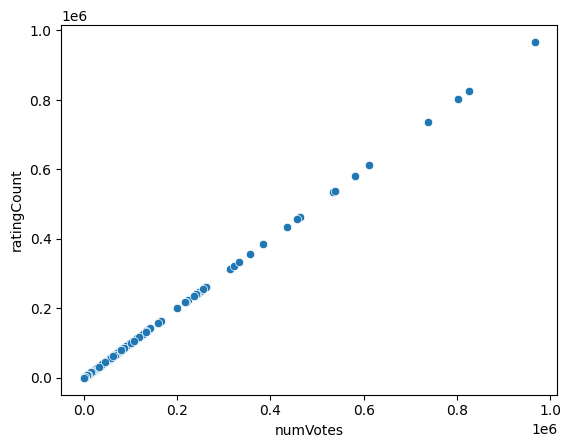

In [19]:
sns.scatterplot(df, x='numVotes', y='ratingCount')
plt.show()

In [20]:
df = df.drop(['ratingCount'], axis=1)

## Analysis of Categorical Features

`genres` and `countryOfOrigin` contain list of values. We can analyse the distribution of these features exploding the dataset such as a record with n genres will be represented by n rows (the same goes for country of origin).

In [21]:
df_expl = df.explode('genres')
df_expl = df_expl.explode('countryOfOrigin')

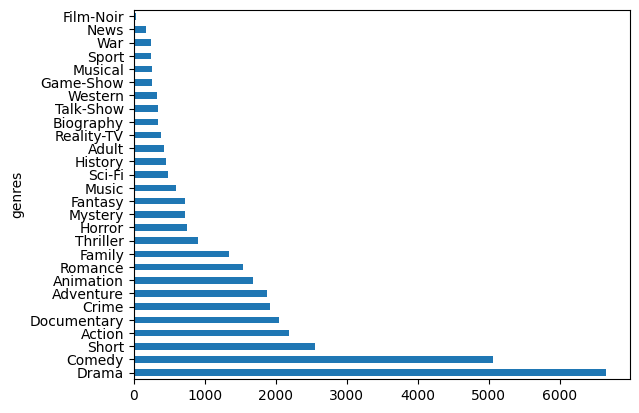

In [22]:
df_expl['genres'].value_counts().plot(kind='barh')
plt.show()

We can see that the feature `isAdult` is redundant with information already present in the `genres` feature, so we can safely drop it from the original data frame.

In [23]:
df_expl[df_expl['genres'] == 'Adult']['isAdult'].value_counts()
df = df.drop('isAdult', axis=1)

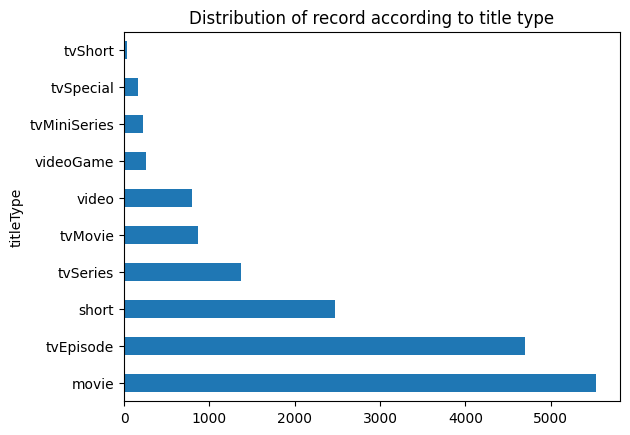

In [24]:
df['titleType'].value_counts().plot.barh()
plt.title("Distribution of record according to title type")
plt.show()

We can see there is some variation in the frequency of different genres wrt title type. Since we have some missing values for the feature `genres`, we will fill them with the most frequent genres with respect to the title type of the record.

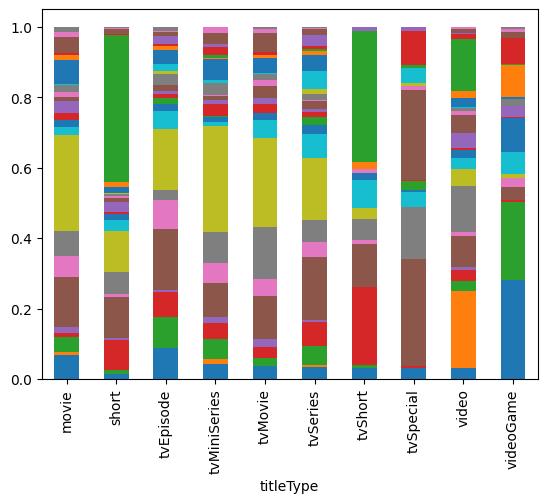

In [25]:
genre_by_titletype = pd.crosstab(df_expl['titleType'], df_expl['genres'])
genre_by_titletype.div(genre_by_titletype.sum(1), axis=0).plot(kind='bar', stacked=True, legend=False)
plt.show()

In [26]:
no_genre = df['genres'].isna()
df[no_genre]['titleType'].value_counts()

titleType
movie           230
tvSeries         53
tvMovie          25
video            23
tvSpecial        18
tvMiniSeries     15
videoGame        12
tvEpisode         6
Name: count, dtype: int64

In [27]:
genrelist_by_type = df.groupby('titleType')['genres'].describe()
genrelist_by_type

,count,unique,top,freq
titleType,,,,
movie,5305,444,[Drama],958
short,2474,208,[Short],402
tvEpisode,4692,334,[Comedy],450
tvMiniSeries,209,81,[Drama],40
tvMovie,843,161,[Drama],157
tvSeries,1322,213,[Comedy],193
tvShort,40,17,"[Animation, Family, Short]",7
tvSpecial,148,30,[Comedy],37
video,769,184,[Adult],193


In [28]:
top_genres = genrelist_by_type['top'].to_dict()
top_genres

{'movie': ['Drama'],
 'short': ['Short'],
 'tvEpisode': ['Comedy'],
 'tvMiniSeries': ['Drama'],
 'tvMovie': ['Drama'],
 'tvSeries': ['Comedy'],
 'tvShort': ['Animation', 'Family', 'Short'],
 'tvSpecial': ['Comedy'],
 'video': ['Adult'],
 'videoGame': ['Action', 'Adventure', 'Fantasy']}

In [29]:
df['genres'].fillna(df['titleType'].map(top_genres), inplace=True)
df[no_genre][['originalTitle', 'titleType', 'genres']].head()


/tmp/ipykernel_8838/4269346808.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['genres'].fillna(df['titleType'].map(top_genres), inplace=True)


,originalTitle,titleType,genres
31,Senjô no nadeshiko,movie,[Drama]
98,Ashbah,movie,[Drama]
113,En fisker i Hanstholm,movie,[Drama]
137,XXXVII Festival Internacional de Cine de San S...,tvSpecial,[Comedy]
245,Shabarimale Swamy Ayyappa,movie,[Drama]


In [30]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16431 entries, 0 to 16430
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   originalTitle                16431 non-null  object 
 1   rating                       16431 non-null  object 
 2   startYear                    16431 non-null  int64  
 3   endYear                      814 non-null    float64
 4   runtimeMinutes               11579 non-null  float64
 5   awardWins                    16431 non-null  float64
 6   numVotes                     16431 non-null  int64  
 7   totalImages                  16431 non-null  int64  
 8   totalVideos                  16431 non-null  int64  
 9   totalCredits                 16431 non-null  int64  
 10  criticReviewsTotal           16431 non-null  int64  
 11  titleType                    16431 non-null  object 
 12  awardNominationsExcludeWins  16431 non-null  int64  
 13  canHaveEpisodes 

No more missing values in the `genres` column.

Since there are too many country of origin, we display only the 20 most frequent ones.

In [31]:
len(df_expl['countryOfOrigin'].unique())

153

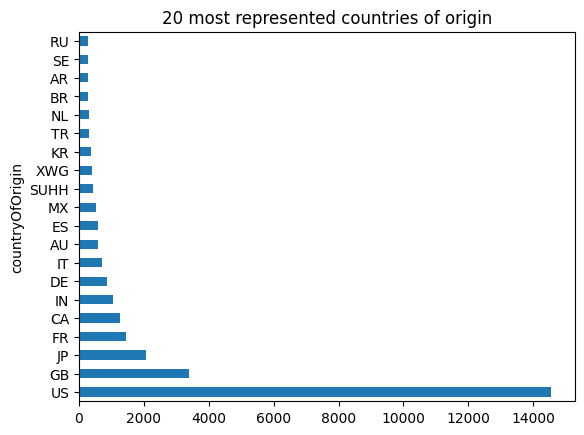

In [32]:
country_counts = df_expl['countryOfOrigin'].value_counts()
country_counts.to_frame().head(20).plot.barh(legend=False)
plt.title("20 most represented countries of origin")
plt.show()

Now that there aren't any more missing values in the `genres` column, we create two new columns that count the number of genres and the number of countries of origin of a record.

In [33]:
df['numGenres'] = df['genres'].str.len()
df['numCountriesOfOrigin'] = df['countryOfOrigin'].str.len()

We add a column that contains the total of reviews overall

In [34]:
df['reviewsTotal'] = df['criticReviewsTotal'] + df['userReviewsTotal']

We also add a column that contains the proportion of review from critics on the total number of reviews of a record.
The missing values in this column are records that were not reviewed:
we set the value of `criticReviewsRatio` for these records to 0. 

In [35]:
df['criticReviewsRatio'] = df['criticReviewsTotal'] / df['reviewsTotal']
print("Number of missing values:", sum(df['criticReviewsRatio'].isnull()))
df['criticReviewsRatio'].fillna(0, inplace=True)

Number of missing values: 8025


/tmp/ipykernel_8838/3371329911.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['criticReviewsRatio'].fillna(0, inplace=True)


We also add a column counting all awards and nominations.

In [36]:
df['awardsAndNominations'] = df['awardWins'] + df['awardNominationsExcludeWins']

## Distribution of numeric features and correlation analysis

We create a list of numeric columns for further analysis.

In [37]:
df.columns

Index(['originalTitle', 'rating', 'startYear', 'endYear', 'runtimeMinutes',
       'awardWins', 'numVotes', 'totalImages', 'totalVideos', 'totalCredits',
       'criticReviewsTotal', 'titleType', 'awardNominationsExcludeWins',
       'canHaveEpisodes', 'numRegions', 'userReviewsTotal', 'countryOfOrigin',
       'genres', 'ratingNum', 'numGenres', 'numCountriesOfOrigin',
       'reviewsTotal', 'criticReviewsRatio', 'awardsAndNominations'],
      dtype='object')

In [38]:
num_cols = ['ratingNum','startYear', 'endYear', 'runtimeMinutes', 'awardWins', 'numVotes',
            'totalImages', 'totalVideos', 'totalCredits', 'criticReviewsTotal', 'awardNominationsExcludeWins',
            'awardsAndNominations', 'numRegions', 'userReviewsTotal', 'numGenres', 'numCountriesOfOrigin',
            'reviewsTotal','criticReviewsRatio']

Looking at the time series for `startYear`, we can see a consistent growth in the number of titles being released each year. In more recent years, we see a significant drop around 2001 (which could be linked to the aftermath of 9/11) and after 2020 (probably due to the Covid-19 pandemic).
As we already know, there is much less data available for `endYear`, but we can see it follows the same trends on a smaller scale. There are no dates available before the 1940s, which is understandable, as serialized content was not produced until around the 1930s.

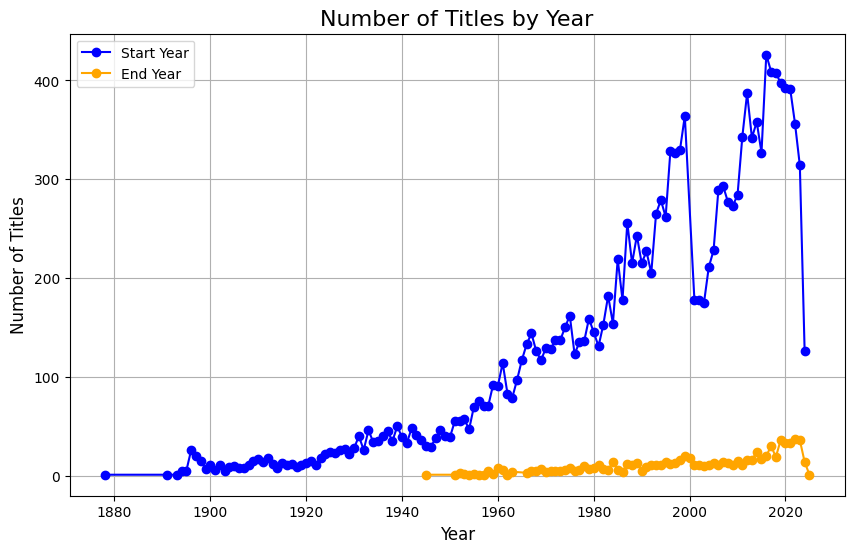

In [39]:
start_year_counts = df['startYear'].value_counts().sort_index()
end_year_counts = df['endYear'].value_counts().sort_index()

plt.figure(figsize=(10, 6))

plt.plot(start_year_counts.index, start_year_counts.values, marker='o', label='Start Year', color='blue')
plt.plot(end_year_counts.index, end_year_counts.values, marker='o', label='End Year', color='orange')

plt.title('Number of Titles by Year', fontsize=16)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Number of Titles', fontsize=12)
plt.legend()
plt.grid(True)
plt.show()

We can see that most numeric features (`awardWins`,`numVotes`, `totalImages`,`totalVideos`,`totalCredits`,`criticReviewsTotal`, `awardNominationsExcludeWins`,`awardsAndNominations`,`numRegions`, `userReviewsTotal`, `numCountriesOfOrigin`, `reviewsTotal`) have heavily right-skewed distributions. It makes sense that the distribution of these type of features would approximate a power law. We can address this problem using a log transformation of these features.

In addition to that `startYear` and `endYear` are heavily correlated so we can drop `endYear` which has also a lot of missing values.

Text(0.5, 1.0, 'Cumulative number of titles by title type across time')

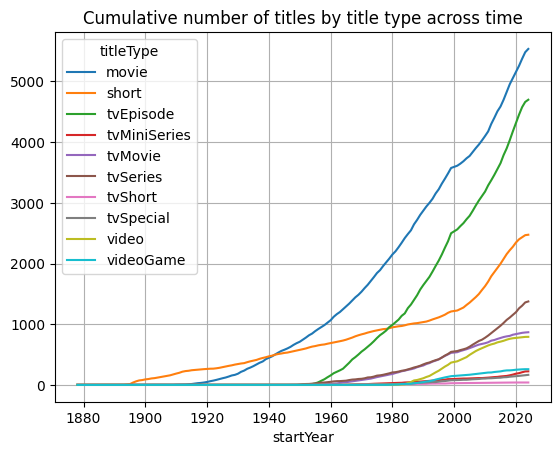

In [84]:
pd.crosstab(df['startYear'], df['titleType']).cumsum().plot.line()
# plt.yscale('log')
plt.grid(True)
plt.title('Cumulative number of titles by title type across time')

When we plot the cumulative annual trend of titles by title type, we can observe that up to the late 1910s only shorts were produced.
From that point on, also movies are produced in notable numbers, overtaking the shorts around 1940. In the 1950s titles produced for television begin to appear (both serialized and non serialized productions).
Another notable trend is the increase in shorts production from the 2000s.

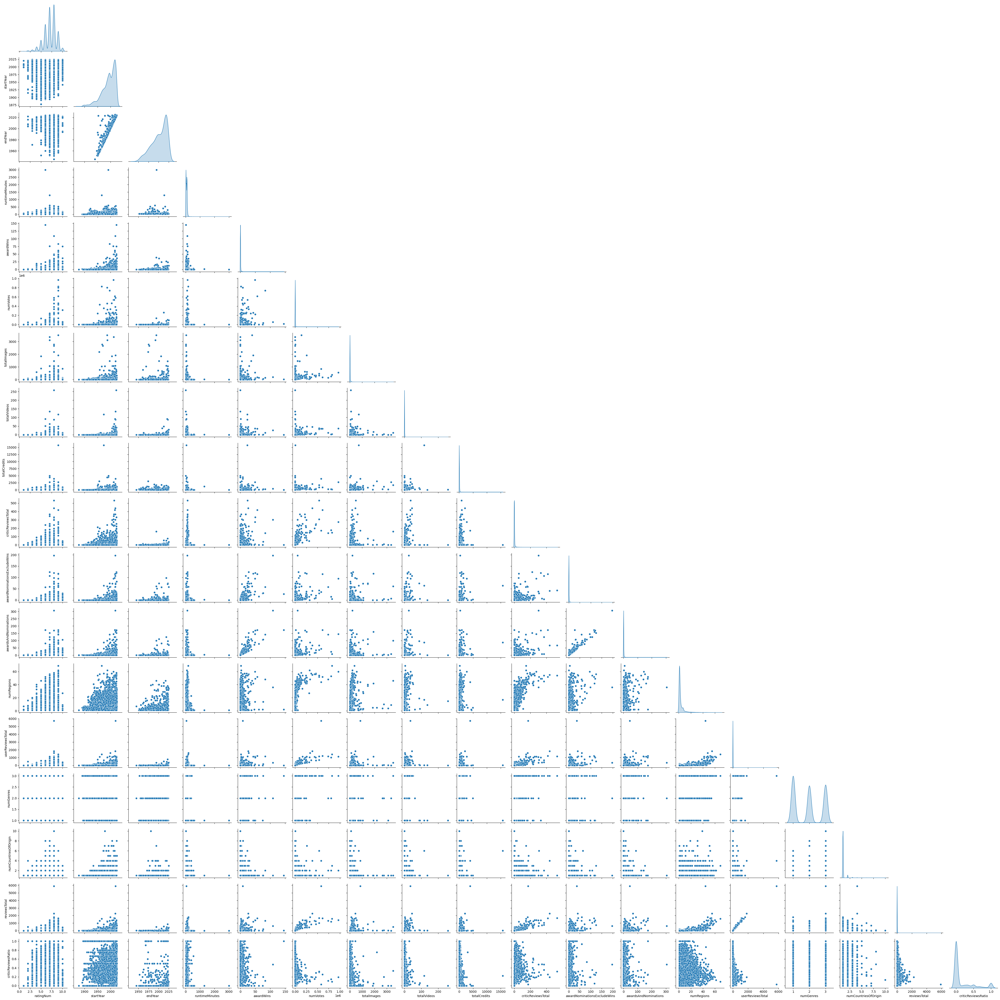

In [41]:
sns.pairplot(df[num_cols], diag_kind='kde', corner=True)

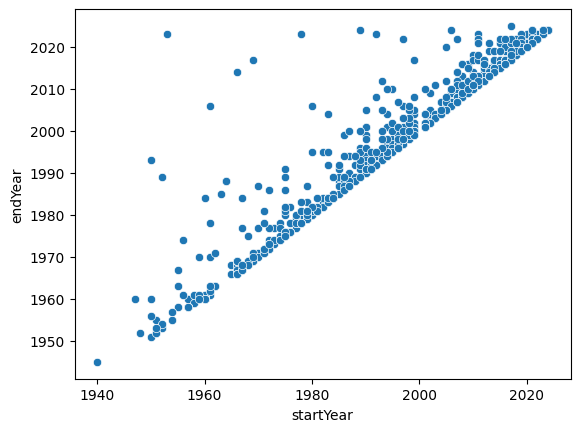

In [42]:
sns.scatterplot(df, x='startYear', y='endYear')
plt.show()

In [43]:
df.drop('endYear', axis=1, inplace=True)
num_cols.remove('endYear')

In [44]:
non_normal_cols = num_cols[3:-4] + num_cols[-3:-1]
non_normal_cols

['awardWins',
 'numVotes',
 'totalImages',
 'totalVideos',
 'totalCredits',
 'criticReviewsTotal',
 'awardNominationsExcludeWins',
 'awardsAndNominations',
 'numRegions',
 'userReviewsTotal',
 'numCountriesOfOrigin',
 'reviewsTotal']

On the other hand, it really doesn't make sense for the runtime distribution to approximate a power law. When excluding outliers (values higher than 3rd quartile + 1.5 IQR) when can see that for the most part runtimes are dependent on the title type and that the distribution of the runtime for each title type approximates a bell curve.

Therefore we prefer not to log transform this variable and be mindful of the presence of outliers for this variable.

<Axes: xlabel='runtimeMinutes'>

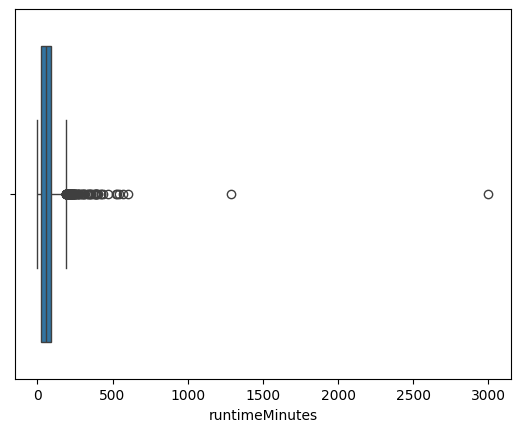

In [45]:
sns.boxplot(df, x='runtimeMinutes')

In [46]:
first_quart = df['runtimeMinutes'].quantile(.25)
third_quart = df['runtimeMinutes'].quantile(.75)
upper_limit = third_quart + 1.5 * (third_quart - first_quart)
inliers = df['runtimeMinutes'] <= upper_limit
upper_limit

np.float64(187.5)

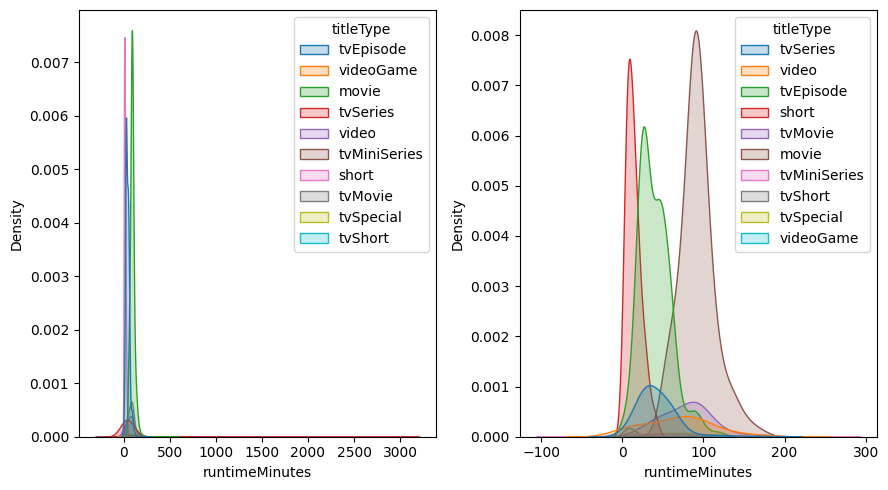

In [47]:
plt.figure(figsize=(9, 5))
plt.subplot(1, 2, 1)
sns.kdeplot(df, x='runtimeMinutes', hue='titleType', fill='titleType', bw_adjust=2)
plt.subplot(1, 2, 2)
sns.kdeplot(df[inliers], x='runtimeMinutes', hue='titleType', fill='titleType', bw_adjust=2)
plt.tight_layout()

In [48]:
df[-inliers].sort_values('runtimeMinutes', ascending=False)[['originalTitle', 'runtimeMinutes', 'titleType','genres']].head(20)

,originalTitle,runtimeMinutes,titleType,genres
13997,Alim Dayi,3000.0,tvSeries,[Comedy]
1280,Jerry Lewis MDA Labor Day Telethon,1290.0,tvSeries,[News]
1098,Voice of the Planet,600.0,tvMiniSeries,[Drama]
6333,Orbius,570.0,movie,[Fantasy]
5998,Heritage: Civilization and the Jews,540.0,tvSeries,[Documentary]
485,Selambs,528.0,tvMiniSeries,[Drama]
6147,Pacífico. Un viaje a los confines del hombre,520.0,tvSeries,[Documentary]
5532,Radosti zemnye,471.0,tvMiniSeries,[Romance]
6378,Willem van Oranje,438.0,tvMiniSeries,"[Biography, Drama, History]"
1254,Los nº1 de 40 en concierto,420.0,tvSpecial,[Music]


Examining the titles with longer runtimes reveals that part of the outliers is due to the inconsistent strategy used for the computation of the runtime for serialized titles (series and miniseries): in some cases the episode runtime is provided in some other times the sum of all episodes runtimes.

#

In [49]:
df_log = df.copy()
for col in non_normal_cols:
    df_log[col] = np.log(df[col] + 1)

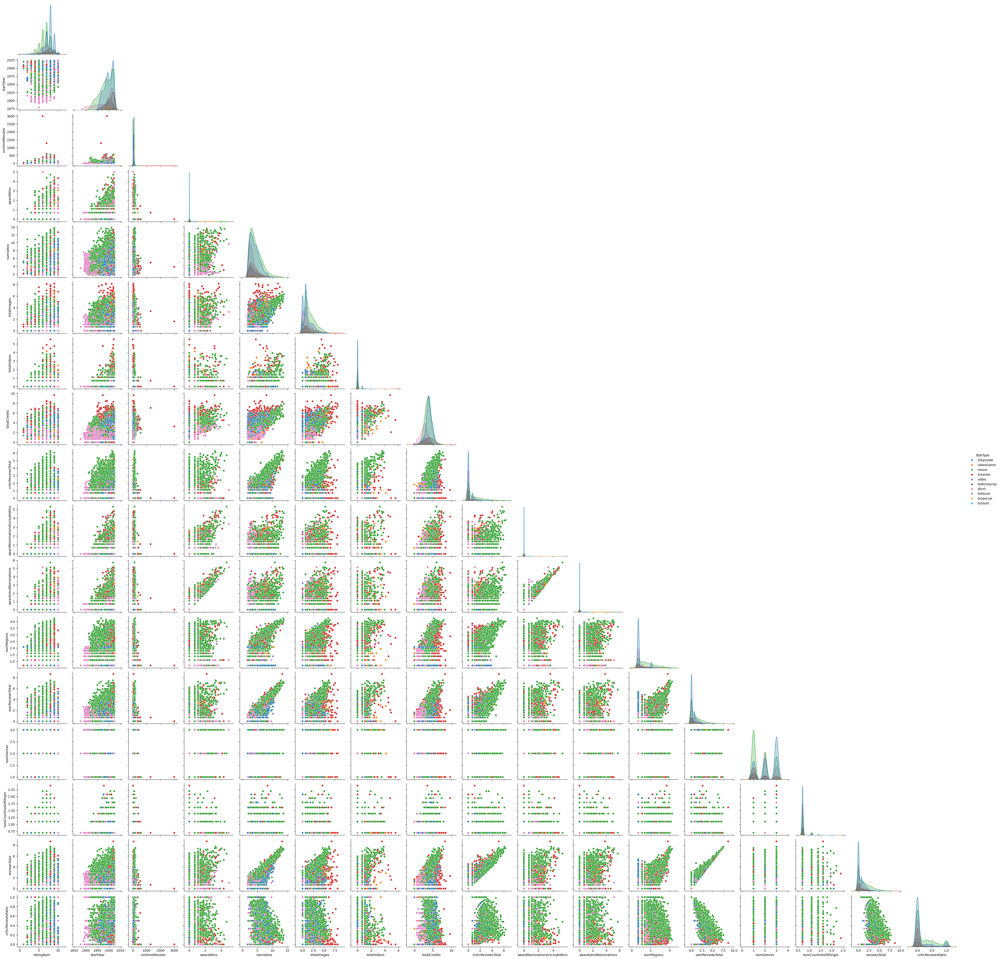

In [50]:
sns.pairplot(df_log[num_cols + ['titleType']], diag_kind='kde', hue='titleType',  corner=True)

<Axes: >

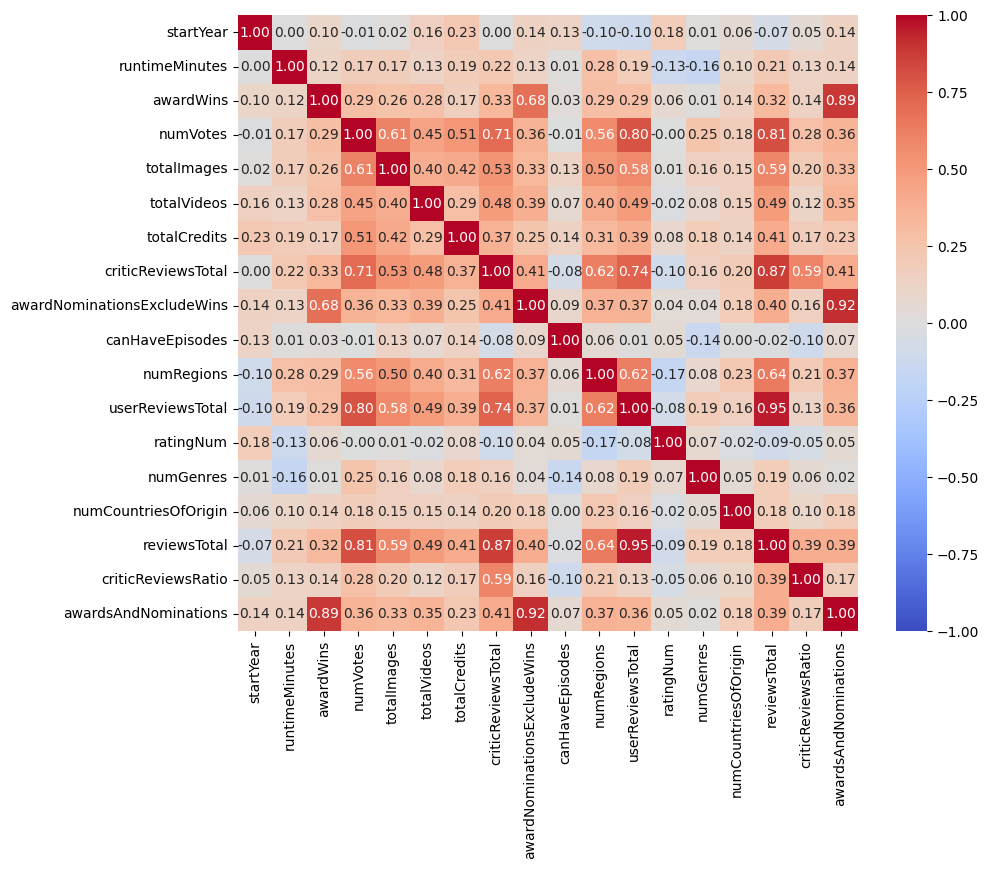

In [51]:
plt.figure(figsize=(10, 8))
sns.heatmap(df_log.corr(numeric_only=True), cmap="coolwarm", center=0, vmin=-1, vmax=1, annot=True, fmt=".2f")

`numVotes`, `userReviewsTotal`, `criticReviewsTotal` and `reviewsTotal` are all highly positively correlated with each other.
We drop them all except `numVotes`, which has the least skewed distribution.

In [52]:
df_log.drop(['userReviewsTotal', 'reviewsTotal', 'criticReviewsTotal'], axis=1, inplace=True)

Since the distribution of awards and nomination is not simply skewed, but the majority of records received no awards and nomination, we convert the `awardsAndNominations` column to boolean and drop all the other columns.

In [53]:
df_log['awardsAndNominations'] = df['awardsAndNominations'] > 0
df_log['awardsAndNominations'].value_counts()

awardsAndNominations
False    13692
True      2739
Name: count, dtype: int64

In [54]:
df_log.drop(['awardWins', 'awardNominationsExcludeWins'], axis=1, inplace=True)

Similarly, the great majority of records had no videos, we create a boolean column `hasVideos` in order to track which records have at least one video and drop the original column.

In [55]:
df_log['hasVideos'] = df['totalVideos'] > 0
df_log['hasVideos'].value_counts()

hasVideos
False    14821
True      1610
Name: count, dtype: int64

In [56]:
df_log.drop(['totalVideos'], axis=1, inplace=True)

As for `numCountriesOfOrigin` the great majority of records has only one country of origin. We can track this information in a boolean column that stores whether the record has more than one country of origin and drop the original column.

In [57]:
df['numCountriesOfOrigin'].value_counts()

numCountriesOfOrigin
1     15285
2       897
3       167
4        51
5        16
6         7
7         5
8         2
10        1
Name: count, dtype: int64

In [58]:
df_log['moreCountriesOfOrigin'] = df['numCountriesOfOrigin'] > 1
print(df_log['moreCountriesOfOrigin'].value_counts())
df_log.drop(['numCountriesOfOrigin'], axis=1, inplace=True)

moreCountriesOfOrigin
False    15285
True      1146
Name: count, dtype: int64


In [59]:
num_cols = list(set(num_cols) - set(['userReviewsTotal', 'reviewsTotal', 'criticReviewsTotal', 'awardWins', 'awardNominationsExcludeWins', 'awardsAndNominations', 'totalVideos', 'numCountriesOfOrigin']))

<Axes: >

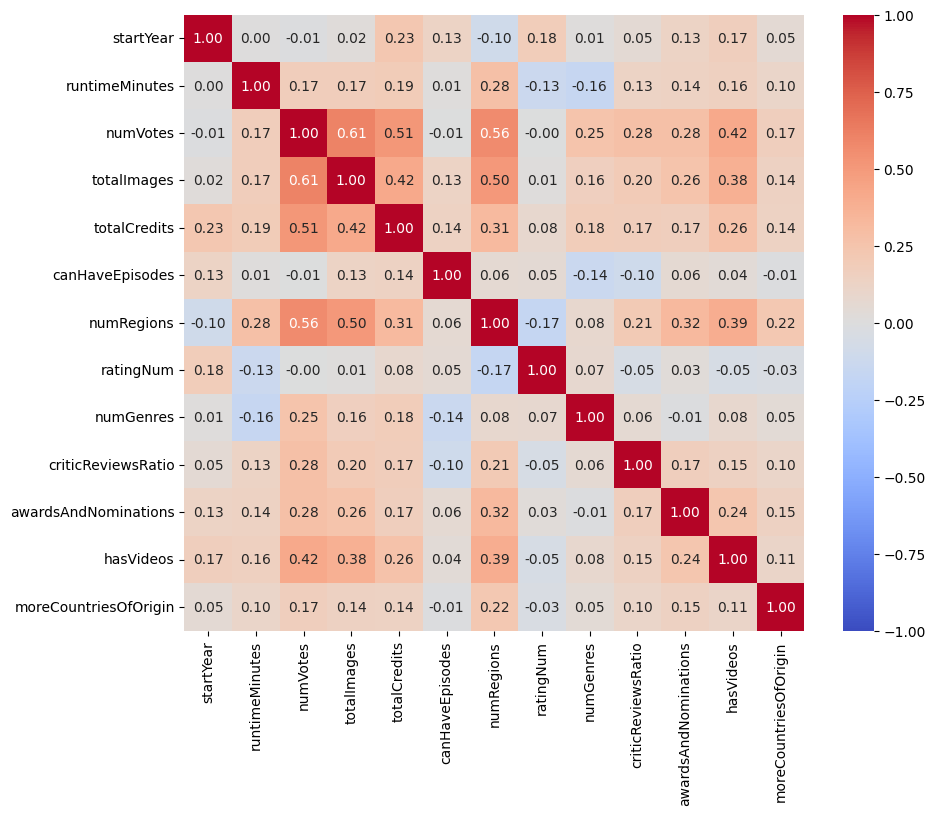

In [60]:
plt.figure(figsize=(10, 8))
sns.heatmap(df_log.corr(numeric_only=True), cmap="coolwarm", center=0, vmin=-1, vmax=1, annot=True, fmt=".2f")

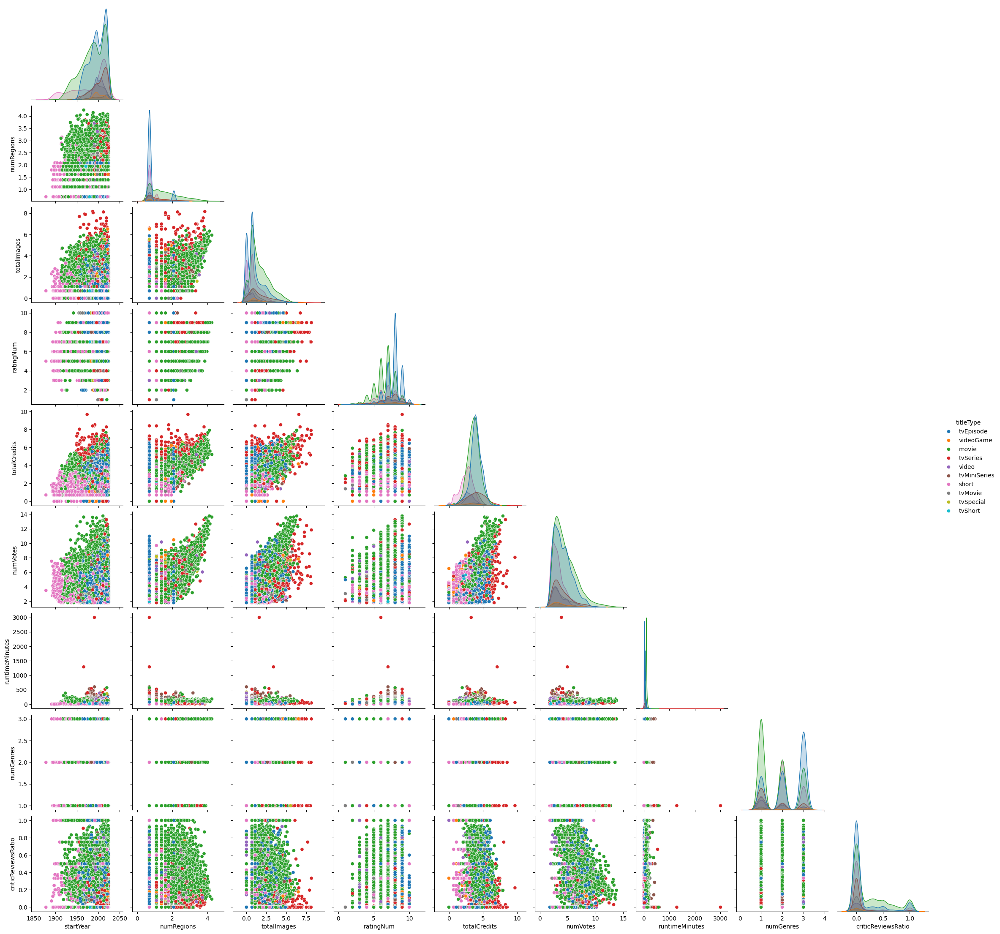

In [61]:
sns.pairplot(df_log[num_cols + ['titleType']], diag_kind='kde', hue='titleType',  corner=True)

We can see that the `runtimeMinutes` is dependent on the `titleType` of a record: movies are generally longer than tv episodes and shorts are tipycally shorter than both. Since we have some missing values for `runtimeMinutes` we can use the median value for that type to fill them.

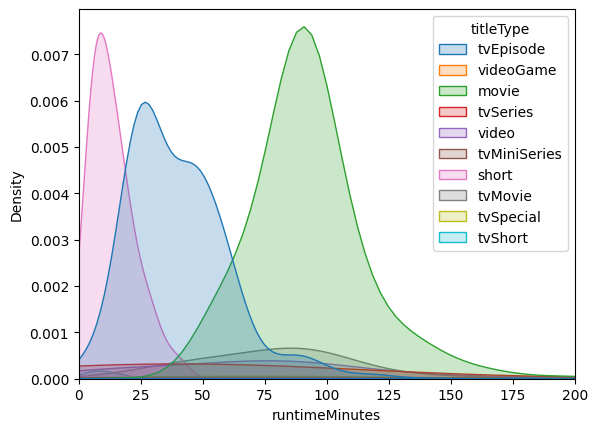

In [62]:
sns.kdeplot(df_log, x='runtimeMinutes', hue='titleType', fill='titleType', bw_adjust=2)
plt.xlim(0, 200)
plt.show()

In [63]:
runtime_by_type = df_log.groupby('titleType')['runtimeMinutes'].median().to_dict()
runtime_by_type

{'movie': 90.0,
 'short': 12.0,
 'tvEpisode': 40.0,
 'tvMiniSeries': 60.0,
 'tvMovie': 86.0,
 'tvSeries': 31.0,
 'tvShort': 10.0,
 'tvSpecial': 60.0,
 'video': 76.0,
 'videoGame': 28.0}

In [64]:
no_runtime = df_log['runtimeMinutes'].isna()

In [65]:
df_log['runtimeMinutes'].fillna(df_log['titleType'].map(runtime_by_type), inplace=True)

/tmp/ipykernel_8838/1206454850.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_log['runtimeMinutes'].fillna(df_log['titleType'].map(runtime_by_type), inplace=True)


In [66]:
df_log.isna().sum()

originalTitle            0
rating                   0
startYear                0
runtimeMinutes           0
numVotes                 0
totalImages              0
totalCredits             0
titleType                0
canHaveEpisodes          0
numRegions               0
countryOfOrigin          0
genres                   0
ratingNum                0
numGenres                0
criticReviewsRatio       0
awardsAndNominations     0
hasVideos                0
moreCountriesOfOrigin    0
dtype: int64

No more missing values

In [67]:
df_log.to_csv( result_dir / 'train_clean.csv')

## Processing the test set

In [68]:
test_df = pd.read_csv( data_dir / 'dm1_dataset_2425_imdb/test.csv', na_values='\\N')
test_df.shape

(5478, 23)

In [69]:
test_df['countryOfOrigin'] = test_df['countryOfOrigin'].apply(ast.literal_eval)
test_df['genres'] = test_df['genres'].str.split(',')

In [70]:
test_df['awardWins'].fillna(0, inplace=True)
test_df['genres'].fillna(df['titleType'].map(top_genres), inplace=True)


test_df['ratingNum'] = test_df['rating']
test_df = test_df.replace({'ratingNum': rating_map})

test_df['numGenres'] = test_df['genres'].str.len()
test_df['numCountriesOfOrigin'] = df['countryOfOrigin'].str.len()
test_df['reviewsTotal'] = test_df['criticReviewsTotal'] + test_df['userReviewsTotal']
test_df['criticReviewsRatio'] = test_df['criticReviewsTotal'] / test_df['reviewsTotal']
test_df['criticReviewsRatio'].fillna(0, inplace=True)
test_df['awardsAndNominations'] = df['awardWins'] + df['awardNominationsExcludeWins']

to_drop = ['bestRating', 'worstRating', 'isRatable', 'ratingCount', 'isAdult', 'endYear']
test_df.drop(to_drop, axis=1, inplace=True)

test_df_log = test_df.copy()
for col in non_normal_cols:
    test_df_log[col] = np.log(test_df[col] + 1)


test_df_log['awardsAndNominations'] = test_df_log['awardsAndNominations'] > 0
test_df_log['hasVideos'] = df['totalVideos'] > 0
test_df_log['moreCountriesOfOrigin'] = test_df_log['numCountriesOfOrigin'] > 1
test_df_log['runtimeMinutes'].fillna(test_df_log['titleType'].map(runtime_by_type), inplace=True)

to_drop = ['userReviewsTotal', 'reviewsTotal', 'criticReviewsTotal', 'awardWins', 'awardNominationsExcludeWins',
           'totalVideos', 'numCountriesOfOrigin']
test_df_log.drop(to_drop, axis=1, inplace=True)


/tmp/ipykernel_8838/1834361650.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  test_df['awardWins'].fillna(0, inplace=True)
/tmp/ipykernel_8838/1834361650.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try usin

In [71]:
test_df_log.isna().sum()

originalTitle            0
rating                   0
startYear                0
runtimeMinutes           0
numVotes                 0
totalImages              0
totalCredits             0
titleType                0
canHaveEpisodes          0
numRegions               0
countryOfOrigin          0
genres                   0
ratingNum                0
numGenres                0
criticReviewsRatio       0
awardsAndNominations     0
hasVideos                0
moreCountriesOfOrigin    0
dtype: int64

In [72]:
test_df_log.to_csv(result_dir / 'test_clean.csv')